In [1]:
import os              
os.environ['PYTHONHASHSEED'] = '0'
import desc          
import pandas as pd                                                    
import numpy as np                                                     
#import scanpy.api as sc                                                                                 
import scanpy as sc                                                                                 
from time import time                                                       
import sys
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
#sc.settings.set_figure_params(dpi=300)
sc.settings.set_figure_params(dpi=120, facecolor="white",)
import tensorflow as tf
tf.__version__

'2.7.0'

In [2]:
#we have downloaded this data, if not, the following will download data automatically
adata=sc.datasets.paul15()
adata.obs['celltype']=adata.obs['paul15_clusters'].str.split("[0-9]{1,2}", n = 1, expand = True).values[:,1]
adata.obs['celltype2']=adata.obs['paul15_clusters']

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/ykolb/miniconda3/envs/tf/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [3]:
sc.pp.log1p(adata)
#sc.pp.filter_genes_dispersion(adata,n_top_genes=1000) #older scanpy
sc.pp.highly_variable_genes(adata,n_top_genes=1000,subset=True,inplace=True)

In [4]:
sc.pp.scale(adata,max_value=6)# if the the dataset has two or more batches you can use `adata=desc.scale(adata,groupby="BatchID")`
save_dir="paul_result_3"
adata=desc.train(adata,
        dims=[adata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=True,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=30, #for reproducible, only use 1 cpu
        num_Cores_tsne=28,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate

Start to process resolution= 0.8
The number of cpu in your computer is 32



2022-05-11 17:41:50.027351: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-11 17:41:51.136028: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-05-11 17:41:51.136054: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: gameboycolor.molgen.mpg.de
2022-05-11 17:41:51.136058: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: gameboycolor.molgen.mpg.de
2022-05-11 17:41:51.136207: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 470.74.0
2022-05-11 17:41:51.136224: I tensorflow/stream_executor/c

Create the directory:paul_result_3 to save result
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
11/11 [==============================] - 0s 6ms/step - loss: 1.0271
Epoch 2/50
11/11 [==============================] - 0s 5ms/step - loss: 0.9866
Epoch 3/50
11/11 [==============================] - 0s 5ms/step - loss: 0.9247
Epoch 4/50
11/11 [==============================] - 0s 5ms/step - loss: 0.8639
Epoch 5/50
11/11 [==============================] - 0s 5ms/step - loss: 0.8305
Epoch 6/50
11/11 [==============================] - 0s 5ms/step - loss: 0.8086
Epoch 7/50
11/11 [==============================] - 0s 5ms/step - loss: 0.7876
Epoch 8/50
11/11 [==============================] - 0s 5ms/step - loss: 0.7733
Epoch 9/50
11/11 [========================

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The value of delta_label of current 1 th iteration is 0.10622710622710622 >= tol 0.005
Epoch 1/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0769
Epoch 2/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0700
Epoch 3/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0645
Epoch 4/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0608
Epoch 5/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0580
The value of delta_label of current 2 th iteration is 0.09377289377289377 >= tol 0.005
Epoch 1/5
11/11 [==============================] - 0s 3ms/step - loss: 0.1010
Epoch 2/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0948
Epoch 3/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0899
Epoch 4/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0864
Epoch 5/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0835
The value of delta_label of current 3 th itera

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne0.8  into the umap coordinates (adata.obsm)

umap finished and added X_umap0.8  into the umap coordinates (adata.obsm)

Start to process resolution= 1.0
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Checking whether paul_result_3/ae_weights.h5  exists in the directory
Pretraining time is 0.006407976150512695
...number of clusters is unknown, Initialize cluster centroid using louvain method
The value of delta_label of current 1 th iteration is 0.1087912087912088 >= tol 0.005
Epoch 1/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0815
Epoch 2/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0749
Epoch 3/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0695
Epoch 4/5
11/11 [==============================] - 0s 3ms/step - loss: 0.0655
Epoch 5/5
11/1

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne1.0  into the umap coordinates (adata.obsm)

umap finished and added X_umap1.0  into the umap coordinates (adata.obsm)

The run time for all resolution is: 54.8609094619751
After training, the information of adata is:
 AnnData object with n_obs × n_vars = 2730 × 1000
    obs: 'paul15_clusters', 'celltype', 'celltype2', 'desc_0.8', 'desc_1.0'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'iroot', 'log1p', 'hvg', 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'


In [66]:
adata.obs['max.prob']=adata.uns["prob_matrix1.0"].max(1)

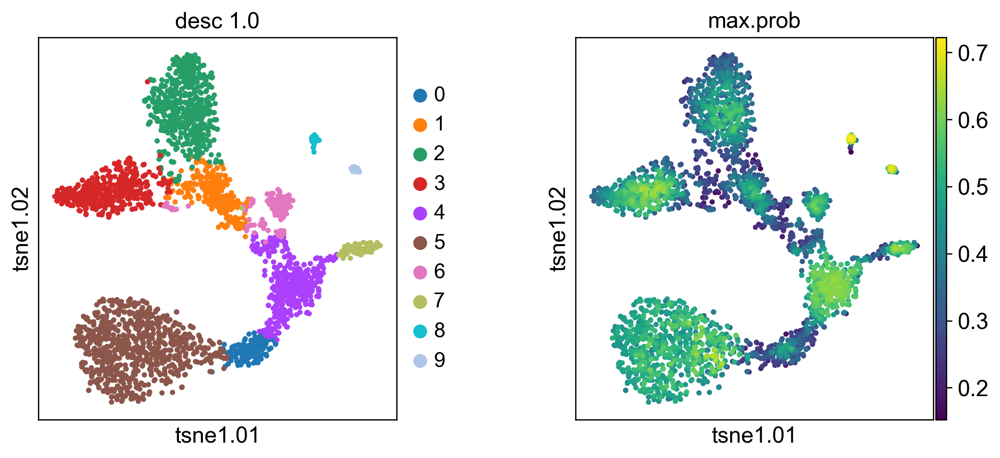

In [67]:
sc.pl.scatter(adata,basis="tsne1.0",color=['desc_1.0','max.prob'])

In [68]:
adata


AnnData object with n_obs × n_vars = 2730 × 1000
    obs: 'paul15_clusters', 'celltype', 'celltype2', 'desc_0.8', 'desc_1.0', 'max.prob'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'iroot', 'log1p', 'hvg', 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0', 'desc_1.0_colors'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'

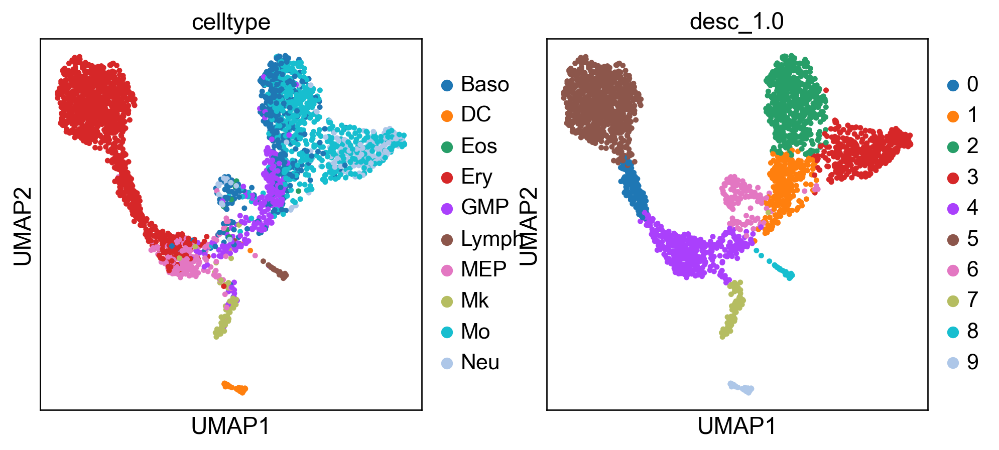

In [69]:
sc.pl.umap(adata, color=["celltype", "desc_1.0"])

In [70]:
adata = sc.read("./data/pancreas.h5ad")
adata
adata.X

array([[0.       , 9.108002 , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 8.77993  , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 8.632374 , 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 3.0799525, ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 2.501896 , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [71]:
sc.pp.scale(adata,max_value=6)# if the the dataset has two or more batches you can use `adata=desc.scale(adata,groupby="BatchID")`
save_dir="DESC_pancreas"
adata=desc.train(adata,
        dims=[adata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=True,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=8, #for reproducible, only use 1 cpu
        num_Cores_tsne=4,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate


Start to process resolution= 0.8
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
62/62 [==============================] - 1s 11ms/step - loss: 0.8412
Epoch 2/50
62/62 [==============================] - 1s 12ms/step - loss: 0.7157
Epoch 3/50
62/62 [==============================] - 1s 12ms/step - loss: 0.6645
Epoch 4/50
62/62 [==============================] - 1s 12ms/step - loss: 0.6361
Epoch 5/50
62/62 [==============================] - 1s 12ms/step - loss: 0.6199
Epoch 6/50
62/62 [==============================] - 1s 12ms/step - loss: 0.6093
Epoch 7/50
62/62 [==============================] - 1s 12ms/step - loss: 0.6012
Epoch 8/50
62/62 [==============================] - 1s 12ms/step - loss: 0.5951
Epoch 9/50

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne0.8  into the umap coordinates (adata.obsm)

umap finished and added X_umap0.8  into the umap coordinates (adata.obsm)

Start to process resolution= 1.0
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Checking whether DESC_pancreas/ae_weights.h5  exists in the directory
Pretraining time is 0.006296634674072266
...number of clusters is unknown, Initialize cluster centroid using louvain method
The value of delta_label of current 1 th iteration is 0.06217715706906447 >= tol 0.005
Epoch 1/5
62/62 [==============================] - 1s 5ms/step - loss: 0.1090
Epoch 2/5
62/62 [==============================] - 0s 5ms/step - loss: 0.0896
Epoch 3/5
62/62 [==============================] - 0s 5ms/step - loss: 0.0770
Epoch 4/5
62/62 [==============================] - 0s 5ms/step - loss: 0.0675
Epoch 5/5
62/

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne1.0  into the umap coordinates (adata.obsm)

umap finished and added X_umap1.0  into the umap coordinates (adata.obsm)

The run time for all resolution is: 616.8805375099182
After training, the information of adata is:
 AnnData object with n_obs × n_vars = 15681 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors', 'desc_0.8', 'desc_1.0'
    var: 'mean', 'std'
    uns: 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'


In [72]:
adata


AnnData object with n_obs × n_vars = 15681 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors', 'desc_0.8', 'desc_1.0'
    var: 'mean', 'std'
    uns: 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'

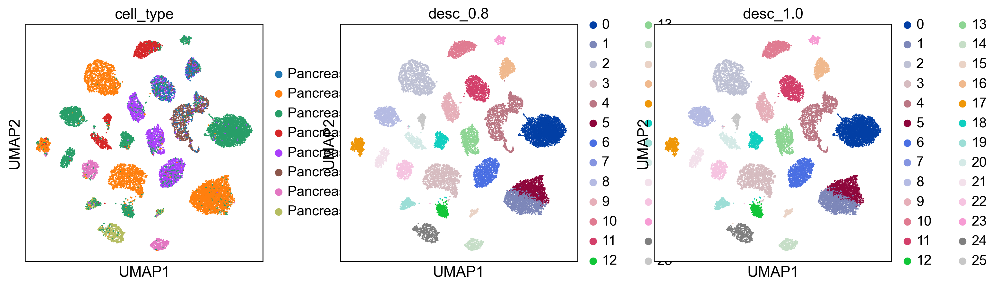

In [73]:
sc.pl.umap(adata, color=["cell_type", "desc_0.8", "desc_1.0"])

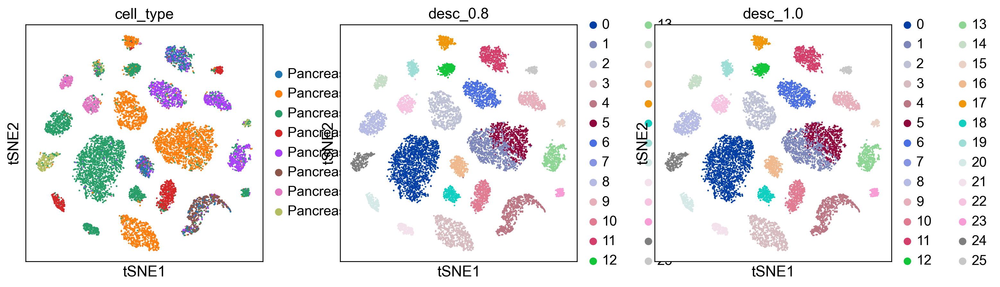

In [74]:

sc.pl.tsne(adata, color=["cell_type", "desc_0.8", "desc_1.0"])

In [75]:
adata
_

AnnData object with n_obs × n_vars = 15681 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors', 'desc_0.8', 'desc_1.0'
    var: 'mean', 'std'
    uns: 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0', 'cell_type_colors', 'desc_0.8_colors', 'desc_1.0_colors'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'

In [76]:
sc.pp.neighbors(adata, use_rep="X_Embeded_z0.8", n_neighbors=10,)
sc.tl.louvain(adata, )

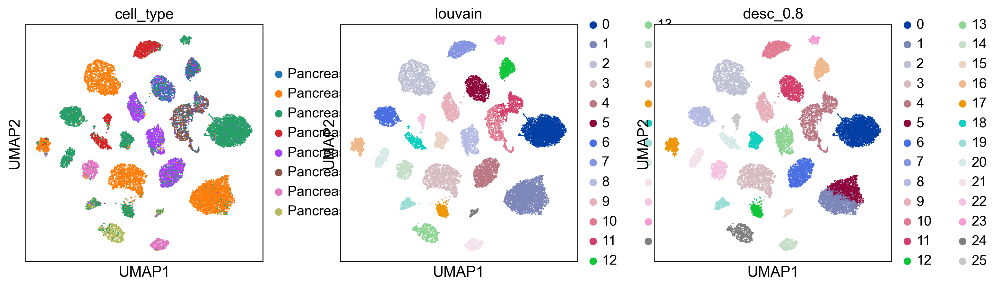

In [77]:
sc.pl.umap(adata, color=["cell_type", "louvain", "desc_0.8",])

In [83]:
sc.neighbors(adata, use_rep="X_Embeded_z1.0", n_neighbors=10,)


TypeError: 'module' object is not callable

In [80]:
adata

AnnData object with n_obs × n_vars = 15681 × 1000
    obs: 'batch', 'study', 'cell_type', 'size_factors', 'desc_0.8', 'desc_1.0', 'louvain'
    var: 'mean', 'std'
    uns: 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0', 'cell_type_colors', 'desc_0.8_colors', 'desc_1.0_colors', 'neighbors', 'louvain', 'louvain_colors'
    obsm: 'X_Embeded_z0.8', 'X_tsne', 'X_tsne0.8', 'X_umap', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    obsp: 'distances', 'connectivities'

In [107]:
#adata = sc.read("./data/GTEx_8_tissues_snRNAseq_immune_atlas_071421.public_obs.h5ad")
adata = sc.read("./data/gtex_v7_SMTS_PP_1k.h5ad")
adata

AnnData object with n_obs × n_vars = 11688 × 1000
    obs: 'smts', 'n_genes', 'leiden', 'louvain'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'smts_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [108]:
sc.pp.scale(adata,max_value=6)# if the the dataset has two or more batches you can use `adata=desc.scale(adata,groupby="BatchID")`
save_dir="desc_gtex_7_1k"
adata=desc.train(adata,
        dims=[adata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=True,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=24, #for reproducible, only use 1 cpu
        num_Cores_tsne=24,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate


Start to process resolution= 0.8
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
46/46 [==============================] - 1s 11ms/step - loss: 0.7500
Epoch 2/50
46/46 [==============================] - 1s 13ms/step - loss: 0.6456
Epoch 3/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5912
Epoch 4/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5617
Epoch 5/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5448
Epoch 6/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5330
Epoch 7/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5230
Epoch 8/50
46/46 [==============================] - 1s 13ms/step - loss: 0.5153
Epoch 9/50

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne0.8  into the umap coordinates (adata.obsm)

umap finished and added X_umap0.8  into the umap coordinates (adata.obsm)

Start to process resolution= 1.0
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Checking whether desc_gtex_7_1k/ae_weights.h5  exists in the directory
Pretraining time is 0.006931304931640625
...number of clusters is unknown, Initialize cluster centroid using louvain method
The value of delta_label of current 1 th iteration is 0.03362422997946612 >= tol 0.005
Epoch 1/5
46/46 [==============================] - 1s 5ms/step - loss: 0.5035
Epoch 2/5
46/46 [==============================] - 0s 6ms/step - loss: 0.4525
Epoch 3/5
46/46 [==============================] - 0s 6ms/step - loss: 0.4275
Epoch 4/5
46/46 [==============================] - 0s 6ms/step - loss: 0.4120
Epoch 5/5
46

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne1.0  into the umap coordinates (adata.obsm)

umap finished and added X_umap1.0  into the umap coordinates (adata.obsm)

The run time for all resolution is: 441.42024326324463
After training, the information of adata is:
 AnnData object with n_obs × n_vars = 11688 × 1000
    obs: 'smts', 'n_genes', 'leiden', 'louvain', 'desc_0.8', 'desc_1.0'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'pca', 'smts_colors', 'tsne', 'umap', 'prob_matrix0.8', 'prob_matrix1.0'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_Embeded_z0.8', 'X_tsne0.8', 'X_umap0.8', 'X_Embeded_z1.0', 'X_tsne1.0', 'X_umap1.0'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


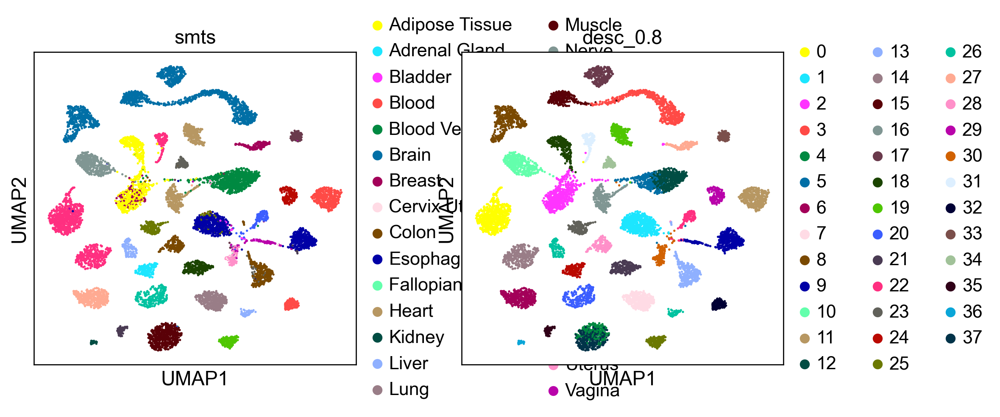

In [110]:
sc.pl.umap(adata, color=["smts", "desc_0.8",])
#adata

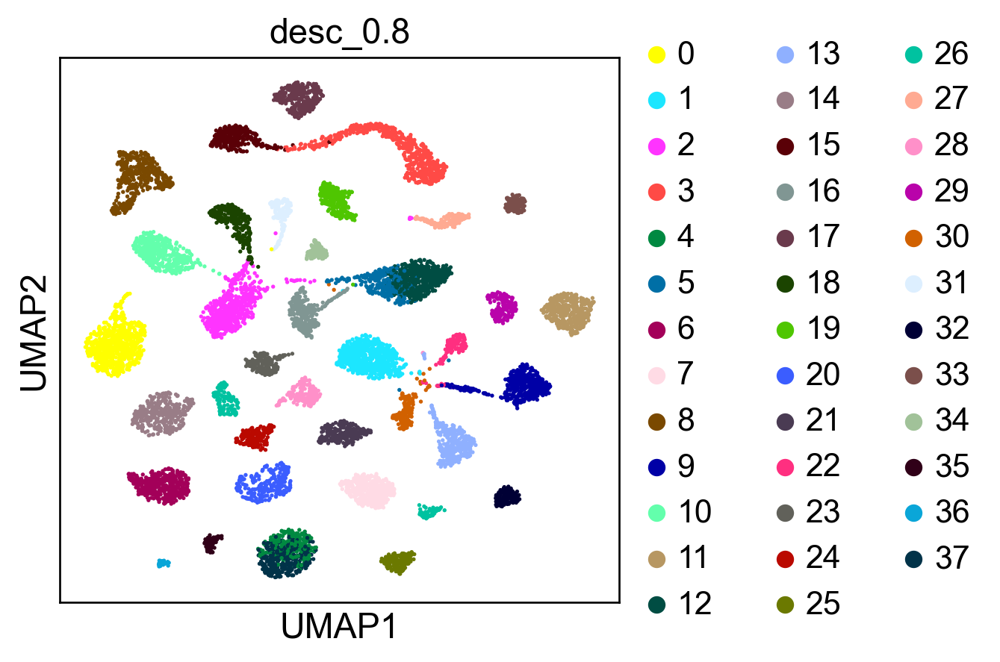

In [111]:
sc.pl.umap(adata, color=["desc_0.8",])


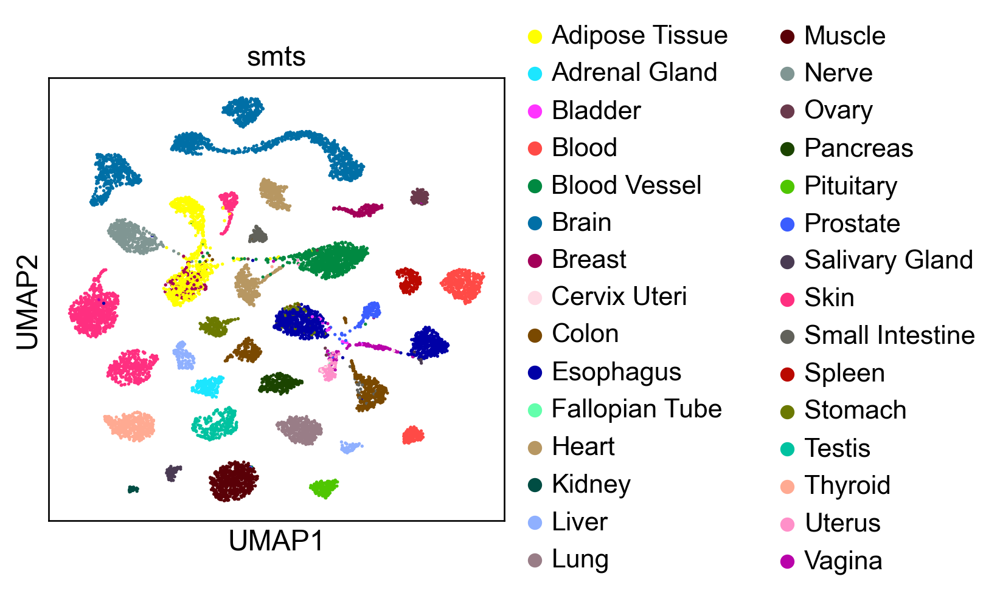

In [112]:
sc.pl.umap(adata, color=["smts",])

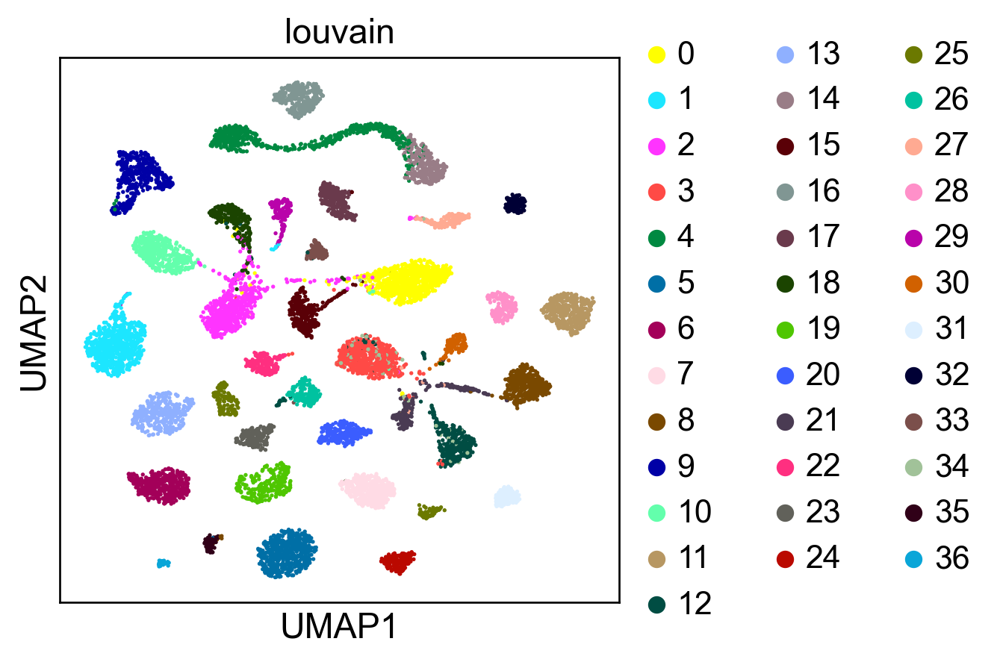

In [113]:
sc.pl.umap(adata, color=["louvain",])

In [100]:
adata = sc.read("./data/GTEx_8_tissues_snRNAseq_immune_atlas_071421.public_obs.h5ad", )
adata.var_names_make_unique()

adata

AnnData object with n_obs × n_vars = 14156 × 16150
    obs: 'n_genes', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Sample ID short', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'annotation', 'broad', 'granular', 'leiden', 'Tissue', 'LAM_prediction'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_colors', 'hvg', 'lam_02_colors', 'leiden', 'leiden_DE', 'neighbors', 'paga', 'participant_id_colors', 'pca', 'prediction_colors', 'prep_colors', 'rank_genes_groups', 'tissue_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'dis

In [101]:
sc.pp.filter_cells(adata, min_genes=200, inplace=True,)
sc.pp.filter_genes(adata, min_cells=20, inplace=True,)
sc.pp.normalize_total(adata, target_sum=1e4, inplace=True,)
sc.pp.log1p(adata, )
#sc.pp.highly_variable_genes(adata, subset=True, inplace=True, )
sc.pp.highly_variable_genes(adata, subset=True, inplace=True, n_top_genes=1000, )
sc.pp.scale(adata, max_value=10,)


In [102]:
adata

AnnData object with n_obs × n_vars = 14154 × 1000
    obs: 'n_genes', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Sample ID short', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'annotation', 'broad', 'granular', 'leiden', 'Tissue', 'LAM_prediction'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_colors', 'hvg', 'lam_02_colors', 'leiden', 'leiden_DE', 'neighbors', 'paga', 'participant_id_colors', 'pca', 'prediction_colors', 'prep_colors', 'rank_genes_groups', 'tissue_colors', 'umap', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [103]:
save_dir="desc_gtex_8_1k_immune"
adata=desc.train(adata,
        dims=[adata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=True,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=8, #for reproducible, only use 1 cpu
        num_Cores_tsne=4,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate


Start to process resolution= 0.8
The number of cpu in your computer is 32
Create the directory:desc_gtex_8_1k_immune to save result
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
56/56 [==============================] - 1s 9ms/step - loss: 0.8611
Epoch 2/50
56/56 [==============================] - 1s 10ms/step - loss: 0.8254
Epoch 3/50
56/56 [==============================] - 1s 11ms/step - loss: 0.8080
Epoch 4/50
56/56 [==============================] - 1s 10ms/step - loss: 0.7951
Epoch 5/50
56/56 [==============================] - 1s 10ms/step - loss: 0.7849
Epoch 6/50
56/56 [==============================] - 1s 10ms/step - loss: 0.7768
Epoch 7/50
56/56 [==============================] - 1s 11ms/step - loss: 0.7706
Epoch 8/50
56/56 [===============

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne0.8  into the umap coordinates (adata.obsm)

umap finished and added X_umap0.8  into the umap coordinates (adata.obsm)

Start to process resolution= 1.0
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Checking whether desc_gtex_8_1k_immune/ae_weights.h5  exists in the directory
Pretraining time is 0.0061779022216796875
...number of clusters is unknown, Initialize cluster centroid using louvain method
The value of delta_label of current 1 th iteration is 0.18517733502896708 >= tol 0.005
Epoch 1/5
56/56 [==============================] - 0s 4ms/step - loss: 0.0239
Epoch 2/5
56/56 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 3/5
56/56 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 4/5
56/56 [==============================] - 0s 4ms/step - loss: 0.0159
Epoc

/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(
/home/ykolb/miniconda3/envs/tf/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


tsne finished and added X_tsne1.0  into the umap coordinates (adata.obsm)

umap finished and added X_umap1.0  into the umap coordinates (adata.obsm)

The run time for all resolution is: 519.2511994838715
After training, the information of adata is:
 AnnData object with n_obs × n_vars = 14154 × 1000
    obs: 'n_genes', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Sample ID short', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'annotation', 'broad', 'granular', 'leiden', 'Tissue', 'LAM_prediction', 'desc_0.8', 'desc_1.0'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_colors', 'hvg', 'lam_02_col

In [104]:
adata

AnnData object with n_obs × n_vars = 14154 × 1000
    obs: 'n_genes', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Sample ID short', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'annotation', 'broad', 'granular', 'leiden', 'Tissue', 'LAM_prediction', 'desc_0.8', 'desc_1.0'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_colors', 'hvg', 'lam_02_colors', 'leiden', 'leiden_DE', 'paga', 'participant_id_colors', 'pca', 'prediction_colors', 'prep_colors', 'rank_genes_groups', 'tissue_colors', 'umap', 'log1p', 'tsne', 'prob_matrix0.8', 'prob_matrix1.0'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'X_Em

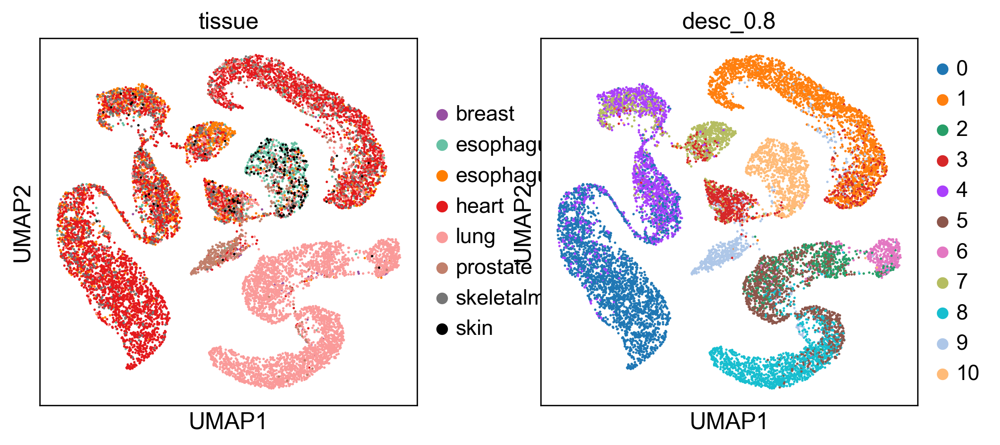

In [105]:
sc.pl.umap(adata, color=["tissue", "desc_0.8",])


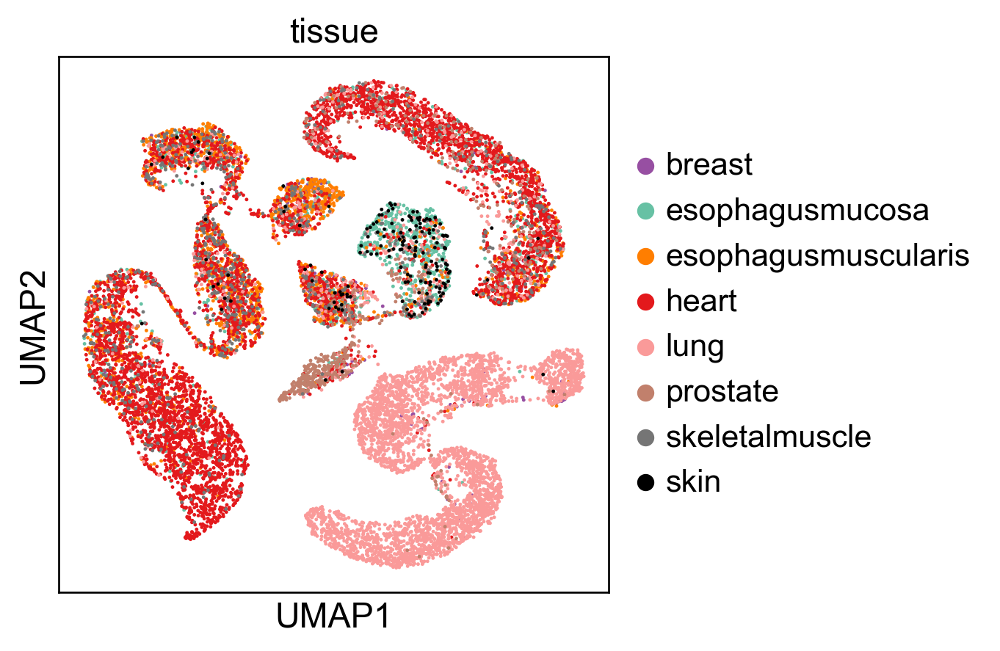

In [106]:
sc.pl.umap(adata, color=["tissue", ])


In [5]:
adata = sc.read("./data/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad")
adata


AnnData object with n_obs × n_vars = 209126 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'Strand', 'gene_name', 'gene_source', 'gene_biotype', 'gene_length', 'gene_coding_length', 'Approved symbol', '

In [6]:
#sc.pp.highly_variable_genes(adata, n_top_genes=1000, inplace=True, subset=True,)
sc.pp.highly_variable_genes(adata, n_top_genes=1000, inplace=True, subset=True,)

In [8]:
adata.X = adata.X.toarray()
adata.X

array([[0.       , 0.       , 0.       , ..., 0.       , 1.4057297,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [9]:
save_dir="desc_gtex_8_1k_all"
adata=desc.train(adata,
        dims=[adata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=False,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=30, #for reproducible, only use 1 cpu
        num_Cores_tsne=28,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate


Start to process resolution= 0.8
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2520
Epoch 2/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2263
Epoch 3/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2169
Epoch 4/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2134
Epoch 5/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2115
Epoch 6/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2105
Epoch 7/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2096
Epoch 8/50
817/817 [==============================] - 4s 5ms/step - loss: 0.2089
Ep

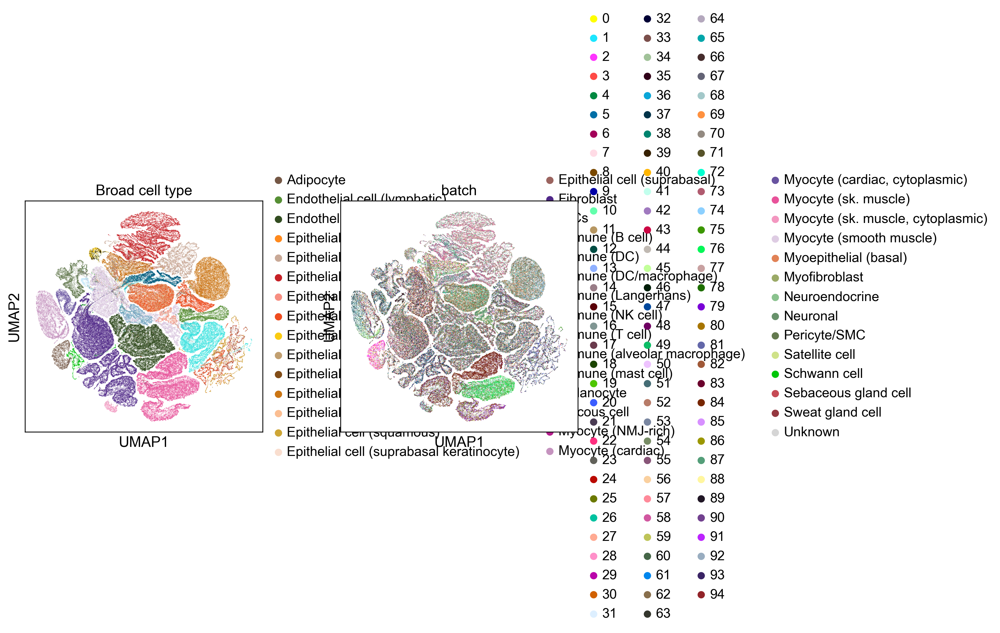

In [10]:
sc.pl.umap(adata, color=["Broad cell type", "batch", ])


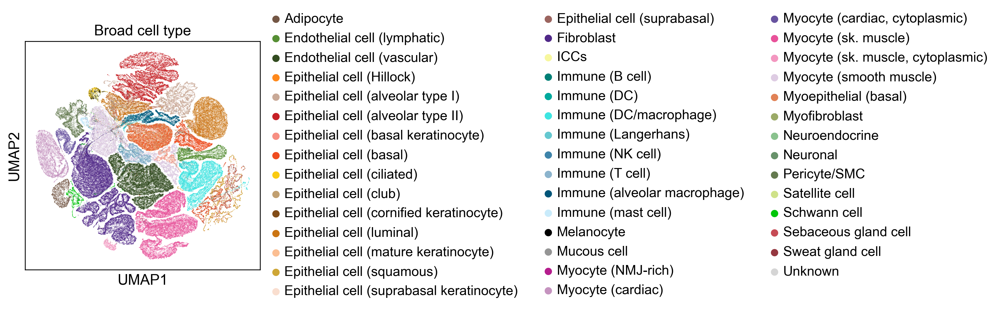

In [11]:
sc.pl.umap(adata, color="Broad cell type")


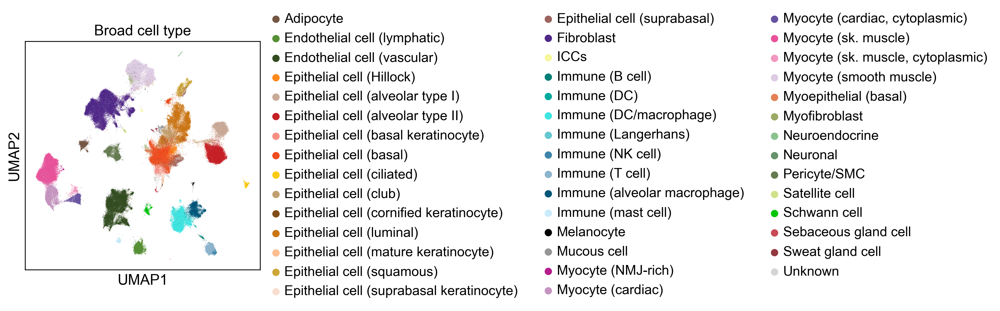

In [12]:
adatac = sc.read("./data/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad")
sc.pl.umap(adatac, color="Broad cell type")


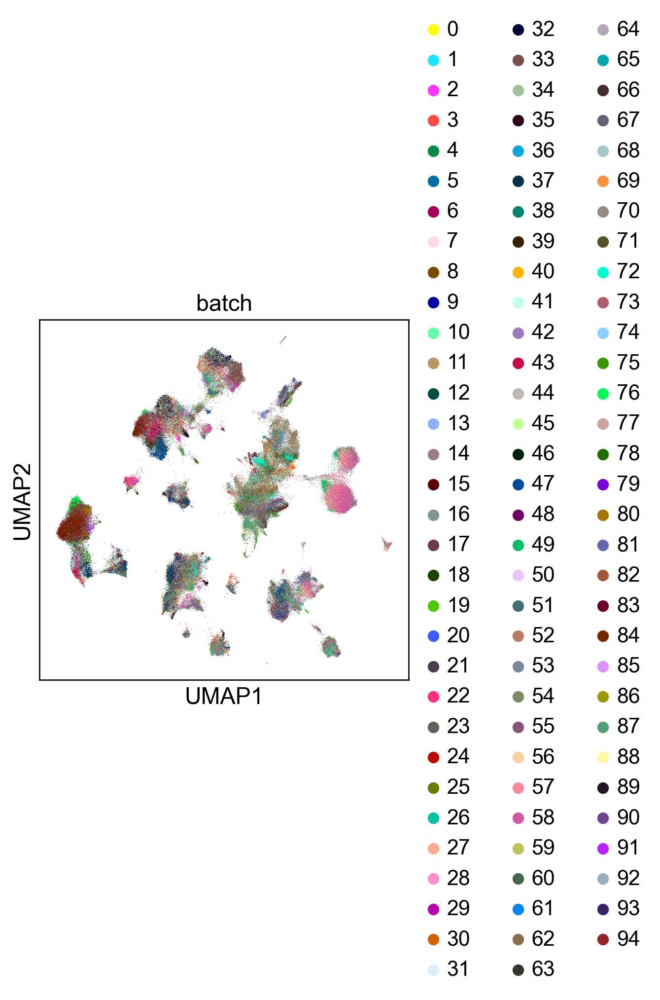

In [13]:
sc.pl.umap(adatac, color="batch")


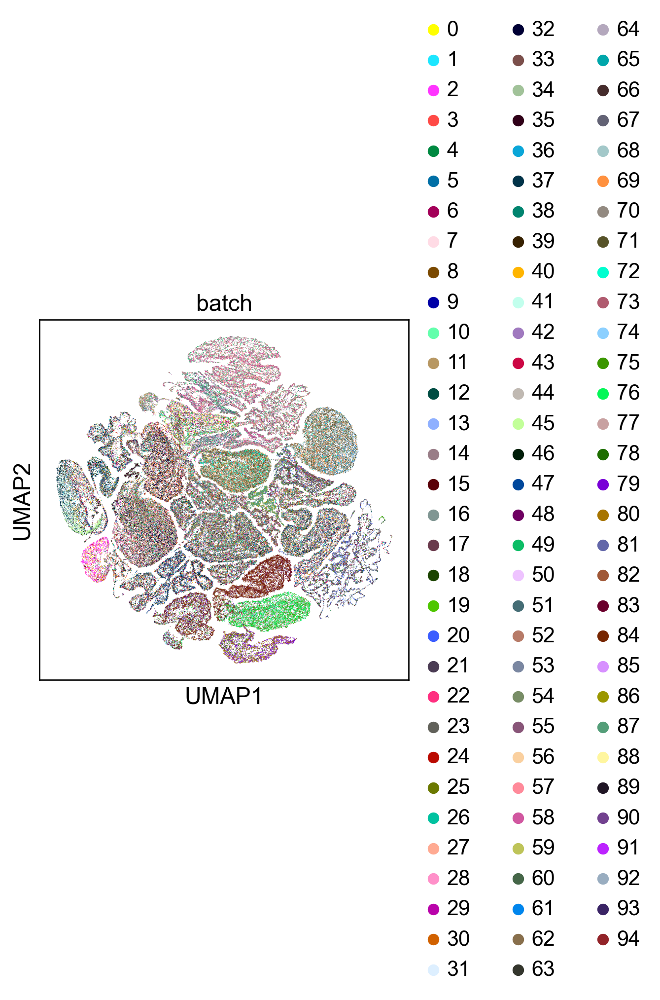

In [14]:
sc.pl.umap(adata, color="batch")


In [28]:
#sc.pl.umap(adata, color=["leiden", ])


In [15]:
bdata = sc.read("./data/GTEx_8_tissues_snRNAseq_immune_atlas_071421.public_obs.h5ad")
bdata

AnnData object with n_obs × n_vars = 14156 × 16150
    obs: 'n_genes', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Sample ID short', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'annotation', 'broad', 'granular', 'leiden', 'Tissue', 'LAM_prediction'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_colors', 'hvg', 'lam_02_colors', 'leiden', 'leiden_DE', 'neighbors', 'paga', 'participant_id_colors', 'pca', 'prediction_colors', 'prep_colors', 'rank_genes_groups', 'tissue_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'dis

In [16]:
sc.pp.highly_variable_genes(bdata, n_top_genes=1000, inplace=True, subset=True,)


In [18]:
bdata.X = bdata.X.toarray()

In [20]:
save_dir="desc_gtex_8_1k_imune2"
adata=desc.train(bdata,
        dims=[bdata.shape[1],64,32],
        tol=0.005,
        n_neighbors=10,
        batch_size=256,
        louvain_resolution=[0.8,1.0],# not necessarily a list, you can only set one value, like, louvain_resolution=1.0
        save_dir=str(save_dir),
        do_tsne=False,
        learning_rate=200, # the parameter of tsne
        use_GPU=True,
        num_Cores=20, #for reproducible, only use 1 cpu
        num_Cores_tsne=28,
        save_encoder_weights=False,
        save_encoder_step=3,# save_encoder_weights is False, this parameter is not used
        use_ae_weights=False,
        do_umap=True) #if do_uamp is False, it will don't compute umap coordiate


Start to process resolution= 0.8
The number of cpu in your computer is 32
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
use_ae_weights=False, the program will rerun autoencoder
Pretraining the 1th layer...
learning rate = 0.1
Epoch 1/50
56/56 [==============================] - 0s 5ms/step - loss: 0.3198
Epoch 2/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2948
Epoch 3/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2782
Epoch 4/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2694
Epoch 5/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2655
Epoch 6/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2627
Epoch 7/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2600
Epoch 8/50
56/56 [==============================] - 0s 5ms/step - loss: 0.2579
Epoch 9/50
56/56 [

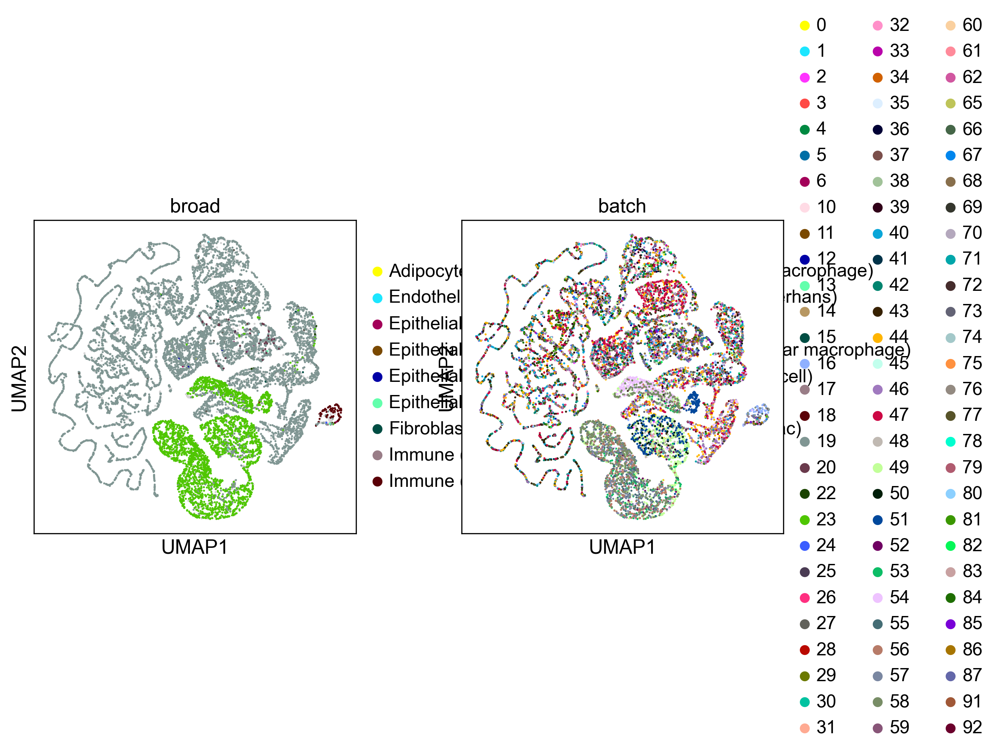

In [21]:
sc.pl.umap(bdata, color=["broad", "batch", ])


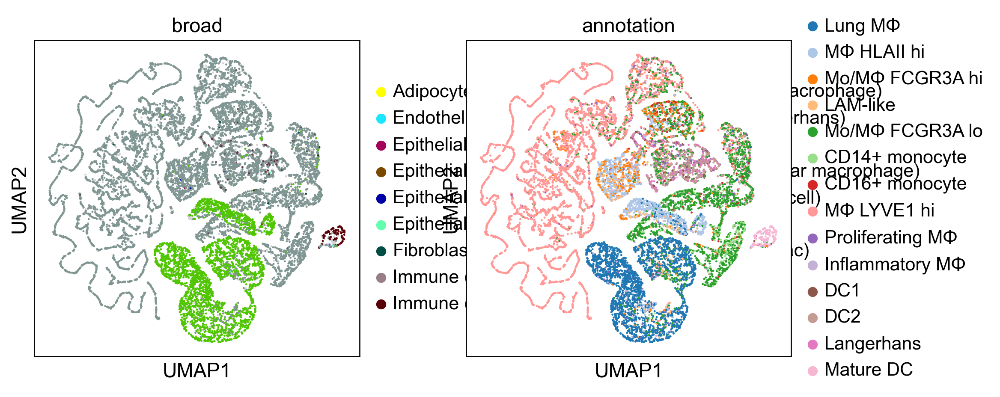

In [22]:
sc.pl.umap(bdata, color=["broad", "annotation", ])

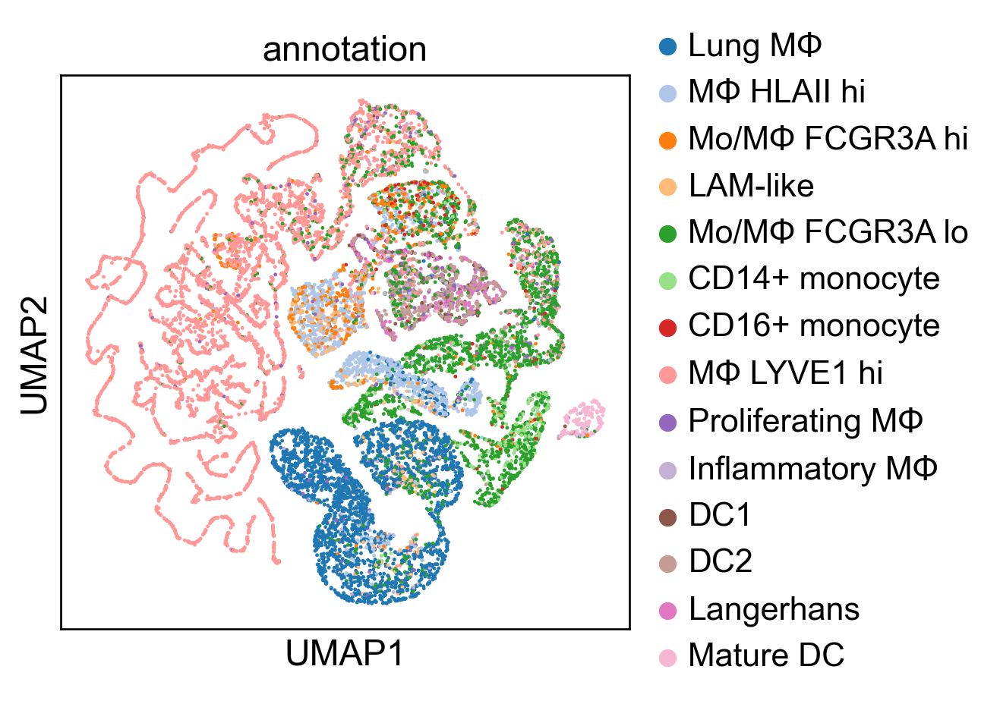

In [23]:
sc.pl.umap(bdata, color=["annotation", ])


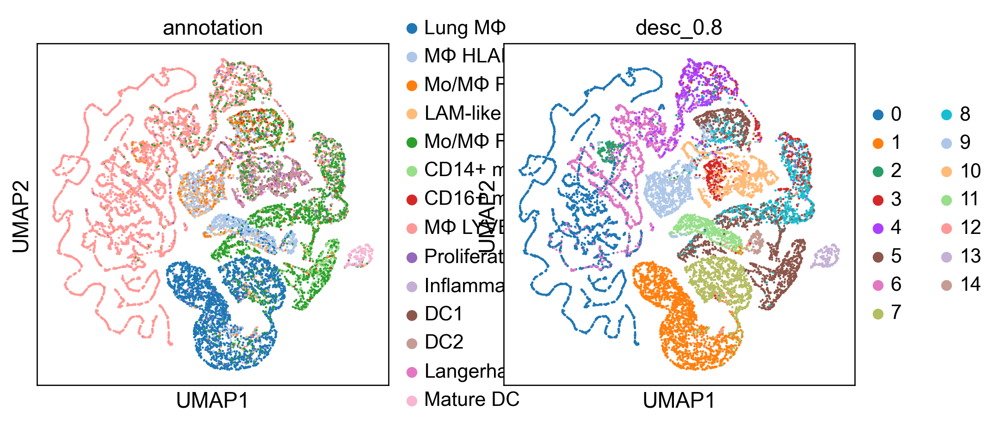

In [30]:
sc.pl.umap(bdata, color=["annotation", "desc_0.8" ])
